In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import nltk
import string

from collections import Counter
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from wordcloud import WordCloud, STOPWORDS

In [2]:
data = pd.read_csv('Resume.csv')

In [3]:
data

,Resumes,Category
0,Name: Ravali P \n\n\n\n ...,React Developer Resume
1,SUSOVAN BAG \n\nSeeking a challenging po...,React Developer Resume
2,Kanumuru Deepak Reddy\n\n\n\n\t\n\n\n\nCAREER ...,React Developer Resume
3,HARIPRIYA BATTINA \n\nExperience as UI Develop...,React Developer Resume
4,KAMALAKAR REDDY. A \n\nLinked In: https://www....,React Developer Resume
...,...,...
74,\tWorkday Integration Consultant\r\rName ...,Workday Resume
75,Srikanth (WORKDAY hCM Consultant)\t ...,Workday Resume
76,WORKDAY | HCM | FCM\n\nName \t\t: Kumar S.S\n\...,Workday Resume
77,Venkateswarlu.B\t\t\t\t\t\t\t\tWorkday Consult...,Workday Resume


In [4]:
# Basic info and summary statistics
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79 entries, 0 to 78
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Resumes   79 non-null     object
 1   Category  79 non-null     object
dtypes: object(2)
memory usage: 1.4+ KB


In [5]:
# Count the number of missing values
data.isnull().sum()

Resumes     0
Category    0
dtype: int64

In [6]:
# Count the number of duplicate rows
data.duplicated().sum()

np.int64(0)

In [7]:
# Check the number of Resume Count
data['Category'].value_counts()

Category
React Developer Resume    24
Workday Resume            21
Peoplesoft Resume         20
SQL Developer Resume      14
Name: count, dtype: int64

## Data Visualization

### Number of Total Resumes

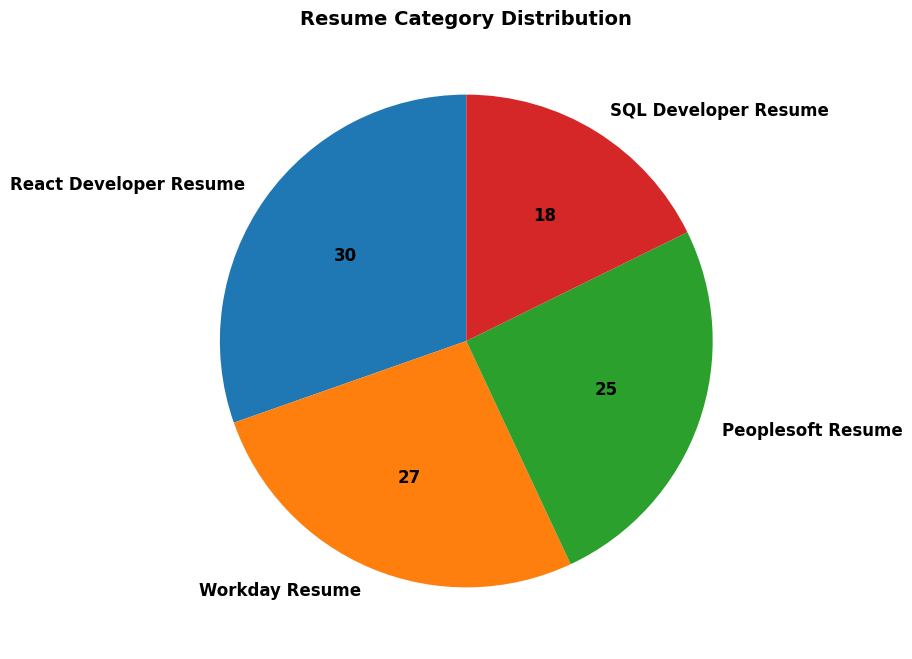

In [8]:
# Automatically get the category counts
counts = data['Category'].value_counts()

# Plot pie chart
fig, ax = plt.subplots(figsize=(8, 8))
ax.pie(
    counts,
    labels=counts.index,
    autopct='%1.0f',  # Display count instead of percentage (no lambda)
    startangle=90,
    textprops={'fontsize': 12, 'fontweight': 'bold', 'color': 'black'}
)
ax.set_title('Resume Category Distribution', fontsize=14, fontweight='bold')
plt.show()


In [9]:
file_path = r'C:\Users\sanke\OneDrive\Desktop\Excelr\Projects\DS Project\Project 3 Resume classification\Resumes_Docx/'
doc_file = []
pdf_file = []
docx_file = []
folder_name = []
for folder in os.listdir(file_path):
    folder_path = file_path+folder
    for file in os.listdir(folder_path):
        if file.endswith('.doc'):
            doc_file.append(file)
            folder_name.append(folder)
        elif file.endswith('.docx'):
            docx_file.append(file)
            folder_name.append(folder)
        else:
            pdf_file.append(file)
            folder_name.append(folder)

In [10]:
print('Number of .doc files = {}'.format(len(doc_file)),'\n'
     'Number of .pdf files = {}'.format(len(pdf_file)),'\n'
     'Number of .docx files = {}'.format(len(docx_file)))

Number of .doc files = 26 
Number of .pdf files = 1 
Number of .docx files = 52


### Type of File Format

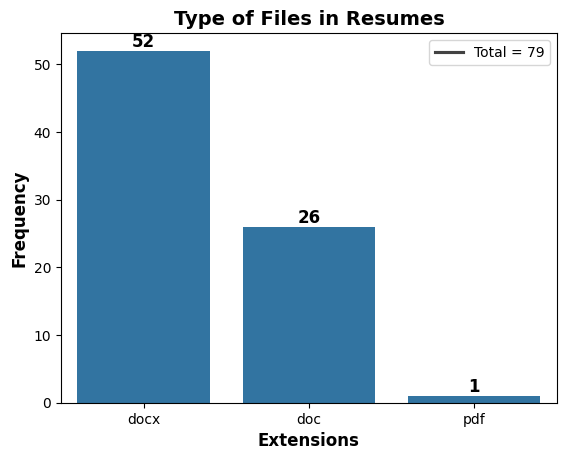

In [11]:
# Prepare data
extensions = pd.Series(['docx', 'doc', 'pdf'])
counts = pd.Series([len(docx_file), len(doc_file), len(pdf_file)])

# Plot
ax = sns.barplot(x=extensions, y=counts)
plt.xlabel('Extensions', fontsize=12, fontweight='bold')
plt.ylabel('Frequency', fontsize=12, fontweight='bold')
plt.title('Type of Files in Resumes', fontsize=14, fontweight='bold')
plt.legend([f'Total = {counts.sum()}'], loc='best')

# Add counts at the top of each bar
for container in ax.containers:
    ax.bar_label(container, fontsize=12, fontweight='bold', color='black')

plt.show()

### Percentage of Extensions in Resumes

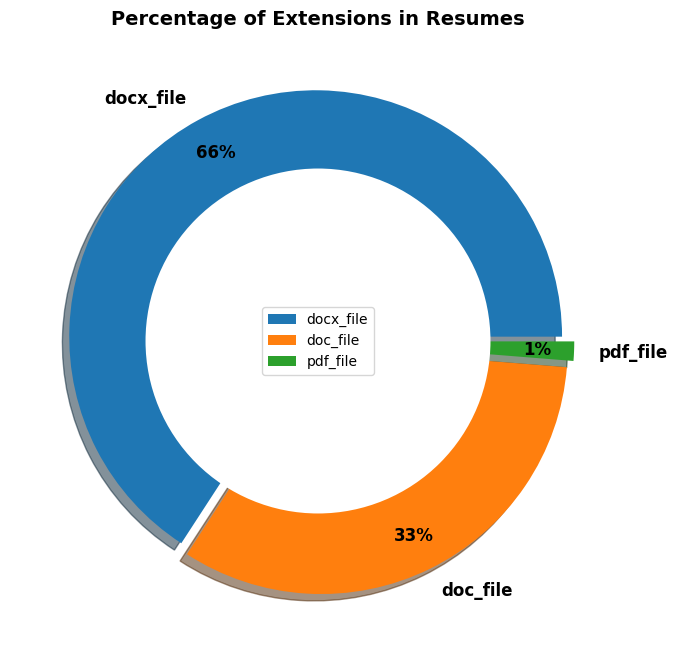

In [12]:
sizes = [len(docx_file), len(doc_file), len(pdf_file)]
labels = ['docx_file', 'doc_file', 'pdf_file']
explode = (0.02, 0.03, 0.04)

fig, ax = plt.subplots(figsize=(8, 8), dpi=100)
wedges, texts, autotexts = ax.pie(
    sizes, labels=labels, autopct='%1.0f%%',
    shadow=True, pctdistance=0.85, explode=explode, startangle=0,
    textprops={'size': 'large', 'weight': 'bold', 'color': 'black'}
)
# Add center circle for donut effect
ax.add_artist(plt.Circle((0, 0), 0.70, fc='white'))

# Title and legend
ax.set_title('Percentage of Extensions in Resumes', fontsize=14, weight='bold')
ax.legend(labels, loc='center')

plt.show()


In [13]:
copy_data = data.copy()

## Number of Words in each Resume

In [14]:
copy_data['word_count'] = copy_data['Resumes'].apply(lambda x: len(str(x).split(" ")))
copy_data[['Resumes','word_count']].head()

,Resumes,word_count
0,Name: Ravali P \n\n\n\n ...,1795
1,SUSOVAN BAG \n\nSeeking a challenging po...,533
2,Kanumuru Deepak Reddy\n\n\n\n\t\n\n\n\nCAREER ...,524
3,HARIPRIYA BATTINA \n\nExperience as UI Develop...,404
4,KAMALAKAR REDDY. A \n\nLinked In: https://www....,357


## Number of Characters

In [15]:
copy_data['Char_Count'] = copy_data['Resumes'].str.len() ## this also includes spaces
copy_data[['Resumes','Char_Count']].head()

,Resumes,Char_Count
0,Name: Ravali P \n\n\n\n ...,6175
1,SUSOVAN BAG \n\nSeeking a challenging po...,1901
2,Kanumuru Deepak Reddy\n\n\n\n\t\n\n\n\nCAREER ...,4005
3,HARIPRIYA BATTINA \n\nExperience as UI Develop...,2669
4,KAMALAKAR REDDY. A \n\nLinked In: https://www....,2672


## Number of Stopwords

In [16]:
stop = stopwords.words('english')
copy_data['Stopwords'] = copy_data['Resumes'].apply(lambda x: len([x for x in x.split() if x in stop]))
copy_data[['Resumes','Stopwords']].head()

,Resumes,Stopwords
0,Name: Ravali P \n\n\n\n ...,179
1,SUSOVAN BAG \n\nSeeking a challenging po...,39
2,Kanumuru Deepak Reddy\n\n\n\n\t\n\n\n\nCAREER ...,138
3,HARIPRIYA BATTINA \n\nExperience as UI Develop...,106
4,KAMALAKAR REDDY. A \n\nLinked In: https://www....,48


## Number of Numerics

In [17]:
copy_data['Numerics'] = copy_data['Resumes'].apply(lambda x: len([x for x in x.split() if x.isdigit()]))
copy_data[['Resumes','Numerics']].head()

,Resumes,Numerics
0,Name: Ravali P \n\n\n\n ...,12
1,SUSOVAN BAG \n\nSeeking a challenging po...,0
2,Kanumuru Deepak Reddy\n\n\n\n\t\n\n\n\nCAREER ...,6
3,HARIPRIYA BATTINA \n\nExperience as UI Develop...,6
4,KAMALAKAR REDDY. A \n\nLinked In: https://www....,8


In [18]:
copy_data

,Resumes,Category,word_count,Char_Count,Stopwords,Numerics
0,Name: Ravali P \n\n\n\n ...,React Developer Resume,1795,6175,179,12
1,SUSOVAN BAG \n\nSeeking a challenging po...,React Developer Resume,533,1901,39,0
2,Kanumuru Deepak Reddy\n\n\n\n\t\n\n\n\nCAREER ...,React Developer Resume,524,4005,138,6
3,HARIPRIYA BATTINA \n\nExperience as UI Develop...,React Developer Resume,404,2669,106,6
4,KAMALAKAR REDDY. A \n\nLinked In: https://www....,React Developer Resume,357,2672,48,8
...,...,...,...,...,...,...
74,\tWorkday Integration Consultant\r\rName ...,Workday Resume,904,6967,197,3
75,Srikanth (WORKDAY hCM Consultant)\t ...,Workday Resume,1063,6737,194,9
76,WORKDAY | HCM | FCM\n\nName \t\t: Kumar S.S\n\...,Workday Resume,1076,8329,236,6
77,Venkateswarlu.B\t\t\t\t\t\t\t\tWorkday Consult...,Workday Resume,1027,6627,193,7


# Data Cleaning Using Regular Expression 

In [24]:
def preprocess(sentence):
    sentence = str(sentence).lower()
    sentence = re.sub(r'<.*?>', '', sentence)
    sentence = re.sub(r'http\S+', '', sentence)
    rem_num = re.sub('[0-9]+', '', rem_url)
    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(sentence)
    filtered_words = [w for w in tokens if len(w) > 2 and w not in stopwords.words('english')]
    return " ".join(filtered_words)

In [25]:
clean_data = pd.read_csv('Resume.csv')
clean_data['Clean_Resumes'] = clean_data.Resumes.apply(lambda x: preprocess(x))

### Clean Text from Resume

In [26]:
clean_data

,Resumes,Category,Clean_Resumes
0,Name: Ravali P \n\n\n\n ...,React Developer Resume,name ravali curriculum vitae specialization co...
1,SUSOVAN BAG \n\nSeeking a challenging po...,React Developer Resume,susovan bag seeking challenging position field...
2,Kanumuru Deepak Reddy\n\n\n\n\t\n\n\n\nCAREER ...,React Developer Resume,kanumuru deepak reddy career objective secure ...
3,HARIPRIYA BATTINA \n\nExperience as UI Develop...,React Developer Resume,haripriya battina experience developer reactjs...
4,KAMALAKAR REDDY. A \n\nLinked In: https://www....,React Developer Resume,kamalakar reddy linked professional summary ye...
...,...,...,...
74,\tWorkday Integration Consultant\r\rName ...,Workday Resume,workday integration consultant name sri krishn...
75,Srikanth (WORKDAY hCM Consultant)\t ...,Workday Resume,srikanth workday hcm consultant seeking suitab...
76,WORKDAY | HCM | FCM\n\nName \t\t: Kumar S.S\n\...,Workday Resume,workday hcm fcm name kumar role workday consul...
77,Venkateswarlu.B\t\t\t\t\t\t\t\tWorkday Consult...,Workday Resume,venkateswarlu workday consultant years experie...


In [27]:
clean_data.drop(['Resumes'], axis = 1, inplace = True)
clean_data

,Category,Clean_Resumes
0,React Developer Resume,name ravali curriculum vitae specialization co...
1,React Developer Resume,susovan bag seeking challenging position field...
2,React Developer Resume,kanumuru deepak reddy career objective secure ...
3,React Developer Resume,haripriya battina experience developer reactjs...
4,React Developer Resume,kamalakar reddy linked professional summary ye...
...,...,...
74,Workday Resume,workday integration consultant name sri krishn...
75,Workday Resume,srikanth workday hcm consultant seeking suitab...
76,Workday Resume,workday hcm fcm name kumar role workday consul...
77,Workday Resume,venkateswarlu workday consultant years experie...


# Frequent Keywords in Cleaned Resumes

In [29]:
oneSetOfStopWords = set(stopwords.words('english') + ['``', "''"])
totalWords = []
Sentences = clean_data['Clean_Resumes'].values
cleanedSentences = ""

for records in Sentences:
    cleanedText = preprocess(records)
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)

wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('experience', 596), ('peoplesoft', 453), ('workday', 430), ('application', 418), ('using', 395), ('server', 358), ('data', 332), ('reports', 326), ('project', 325), ('sql', 279), ('business', 273), ('web', 249), ('database', 243), ('process', 236), ('worked', 220), ('knowledge', 216), ('client', 197), ('system', 192), ('involved', 191), ('tools', 190), ('integrations', 189), ('integration', 183), ('hcm', 182), ('like', 180), ('support', 178), ('skills', 169), ('good', 169), ('development', 168), ('team', 166), ('creating', 164), ('working', 162), ('people', 160), ('services', 157), ('technical', 156), ('report', 155), ('design', 154), ('servers', 152), ('testing', 150), ('created', 150), ('react', 148), ('responsibilities', 147), ('various', 146), ('role', 142), ('oracle', 142), ('environment', 139), ('developer', 137), ('management', 136), ('security', 134), ('eib', 134), ('production', 133)]


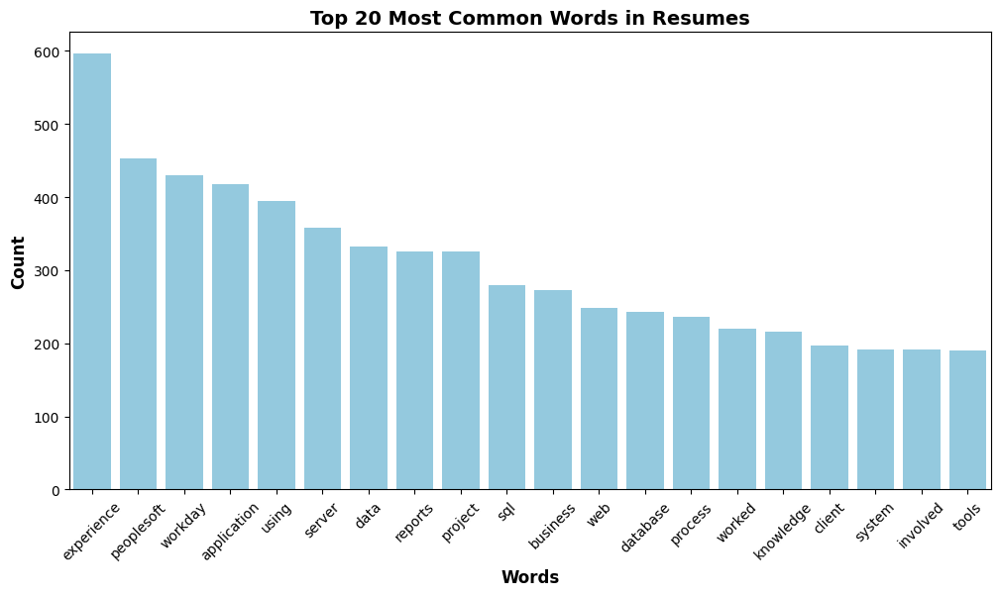

In [30]:
# Combine all resumes into one big text
all_text = ' '.join(clean_data['Clean_Resumes'].astype(str))

# Tokenize and count words
word_counts = Counter(all_text.split())

# Get the top 20 most common words
top_20 = word_counts.most_common(20)

# Separate words and counts for plotting
words, counts = zip(*top_20)

# Create bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x=list(words), y=list(counts), color='skyblue', legend=False)

plt.title('Top 20 Most Common Words in Resumes', fontsize=14, fontweight='bold')
plt.xlabel('Words', fontsize=12, fontweight='bold')
plt.ylabel('Count', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, fontsize=10)
plt.show()


In [33]:
data.Resumes[20]

' \n \n \nPage | 1  \n \nName: M. Prabakaran \nTitle: UI Developer \n \nPROFESSIONAL SUMMARY \n \n● 2.4+ years of Professional IT experience as a software developer having knowledge on different UI based \nApplication. \n● Hands on experience in HTML, CSS, JS, ReactJS.   \n● Hands on experience in handling UI interaction, Design methodology. \n● Handling In-App purchase, uploading and maintaining apps in play store. \n● Hands on experience with customization over base-product depends on client requirement.  \n● Cohesive team worker, having strong analytical, problem solving and interpersonal skills. \n \nEDUCATION \n \n● \nCompleted on 2017 Bachelor of Technology (ECE), PRIST University, Tamil Nadu. \n● \nCompleted on 2012 Higher Secondary, Mount Park Hr Sec School, Thiyagadurgam, Tamil Nadu. \n● \nCompleted on 2010 SSLC, Krishnasamy Hr Sec School, Cuddalore, Tamil Nadu. \n \nSKILLS \n \nOperating System \nWindows, Unix,Mac \nProgramming Languages \nHTML, CSS, JS, React \nMobile App De

In [34]:
clean_data.Clean_Resumes[20]

'page name prabakaran title developer professional summary years professional experience software developer knowledge different based application hands experience html css reactjs hands experience handling interaction design methodology handling app purchase uploading maintaining apps play store hands experience customization base product depends client requirement cohesive team worker strong analytical problem solving interpersonal skills education completed bachelor technology ece prist university tamil nadu completed higher secondary mount park sec school thiyagadurgam tamil nadu completed sslc krishnasamy sec school cuddalore tamil nadu skills operating system windows unix mac programming languages html css react mobile app development windows android apps designing constatinant layout motion layout architectural pattern mvc ide android studio services aws bucket service bitbucket project details project boomi name project commerce online store developed maintains react code role f

# Using the Word Clowds

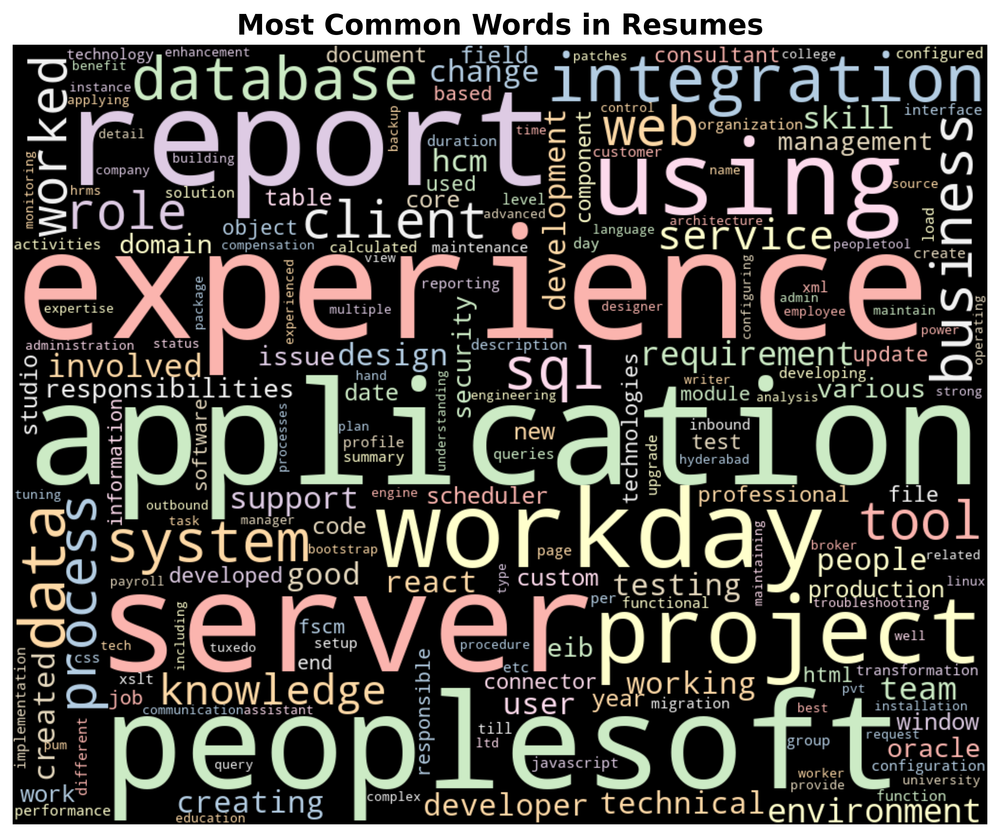

In [35]:
# Combine all resume text into one string
text = " ".join(resume for resume in clean_data['Clean_Resumes'].dropna())

# Create the Word Cloud
word_cloud = WordCloud(
    width=1000,
    height=800,
    random_state=10,
    background_color="black",
    colormap="Pastel1",
    collocations=False,
    stopwords=STOPWORDS
).generate(text)

# Display the Word Cloud
plt.figure(figsize=(10, 8), dpi=300)
plt.title('Most Common Words in Resumes', fontsize=16, fontweight='bold')
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")

# Save the Word Cloud image (create IMG folder if it doesn't exist)
os.makedirs('IMG', exist_ok=True)
word_cloud.to_file('IMG/Word_Clouds.png')
plt.show()

#  Most common words in Different Profile Resumes

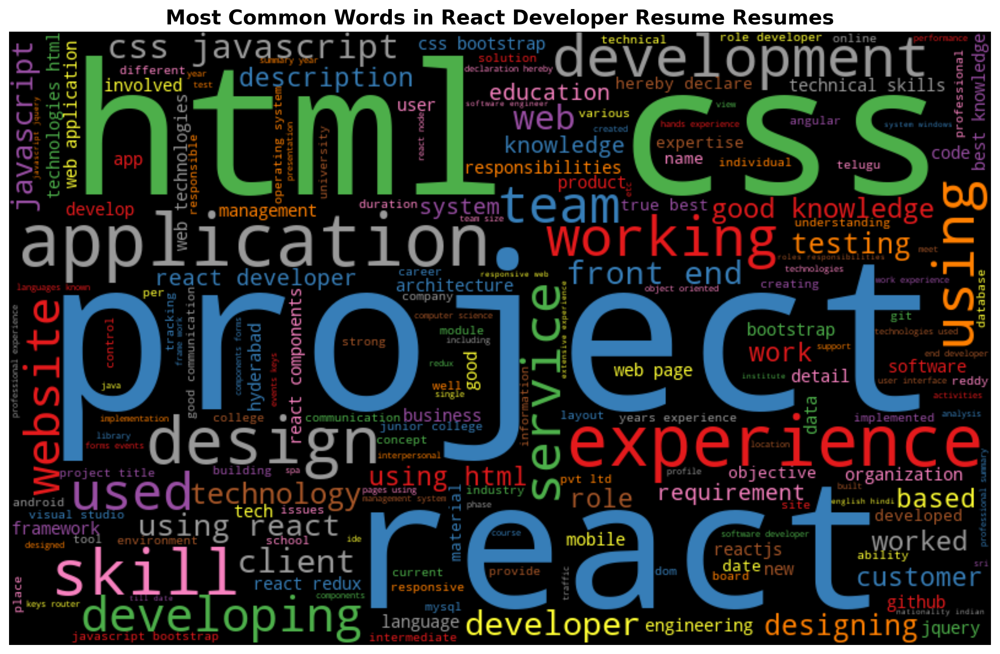

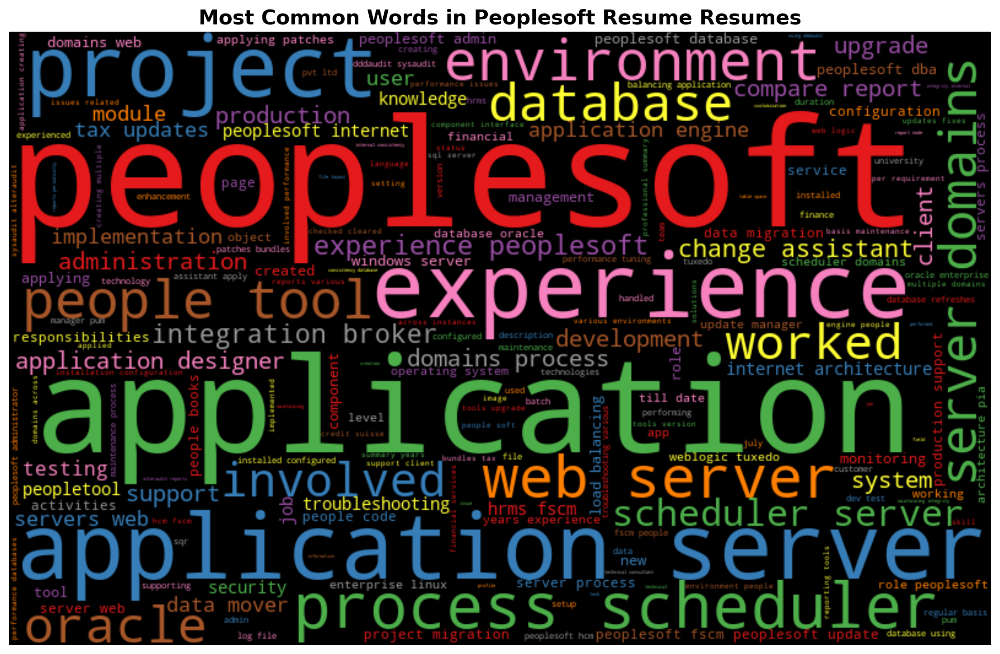

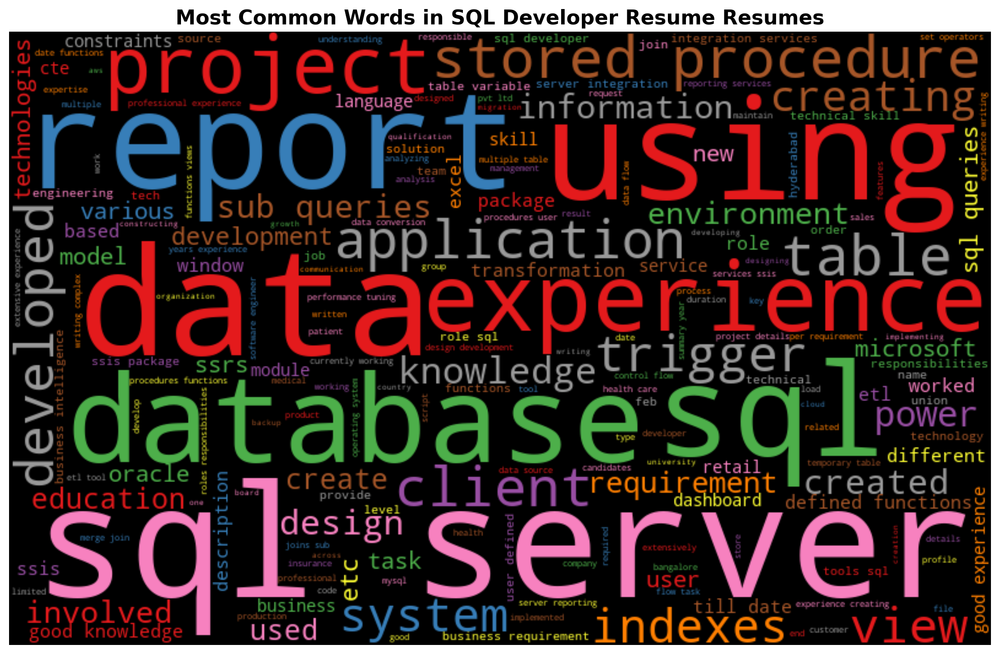

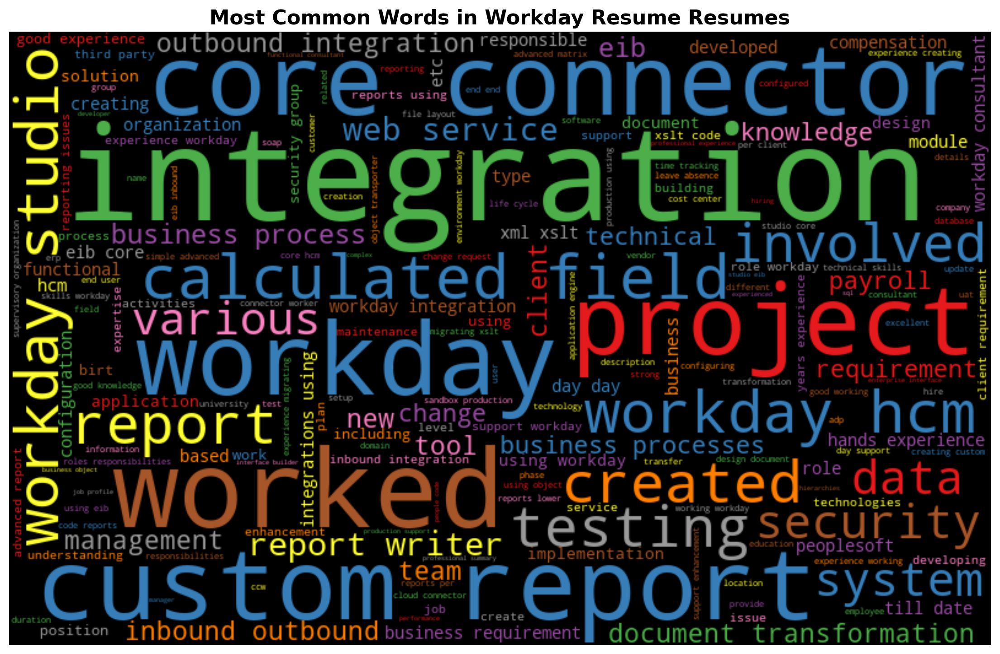

In [36]:
def generate_wordcloud(all_words, profile):
    wordcloud = WordCloud(
        width=800, height=500, background_color='black',
        max_words=200, colormap='Set1'
    ).generate(all_words)

    plt.figure(figsize=(14, 10), dpi=200)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Most Common Words in {profile} Resumes', fontsize=16, fontweight='bold')
    plt.show()

# Loop through each unique profile (category)
for profile in clean_data['Category'].unique():
    all_words = ' '.join(clean_data['Clean_Resumes'][clean_data['Category'] == profile])
    generate_wordcloud(all_words, profile)


# Final Data

In [37]:
clean_data.head()

,Category,Clean_Resumes
0,React Developer Resume,name ravali curriculum vitae specialization co...
1,React Developer Resume,susovan bag seeking challenging position field...
2,React Developer Resume,kanumuru deepak reddy career objective secure ...
3,React Developer Resume,haripriya battina experience developer reactjs...
4,React Developer Resume,kamalakar reddy linked professional summary ye...


In [38]:
#clean_data.to_csv('Clean_data.csv', index=False)

In [39]:
#clean_data.to_csv('Clean_data.txt', sep='\t', index=False)